## 1. <b>Filtrado de imágenes</b>

In [ ]:
!pip install opencv-python

In [ ]:
import os # Importación del modulo os, que proporciona funciones para interactuar con el sistema operativo
import cv2 # Importa cv2, que es la bilbiloteca OpenCV, utilizada para tareas de visión por computadora y procesamiento de imagenes.
import matplotlib.pyplot as plt # Librería gráficos
import numpy as np # libreria matrices
import tensorflow as tf # Libreria Machine learning
tf.random.set_seed(0)

Cargar la imagen de ejemplo

Puedes descargar una imagen desde una URL utilizando la función get_file de TensorFlow:

```python
tf.keras.utils.get_file(
    fname, origin, untar=False, md5_hash=None, file_hash=None,
    cache_subdir='datasets', hash_algorithm='auto',
    extract=False, archive_format='auto', cache_dir=None
)
````

In [ ]:
img_folder = "../../images" # ruta de directorio
url = 'https://i.ibb.co/vd1SqSM/The-grandeur-of-the-Taj-Mahal-and-its-intricate-stone-inlays-immediately-greets-the-visitor-upon-ent.jpg' # Dirección url web de una imagen
image_path = tf.keras.utils.get_file("taj-mahal-2.jpg", url) # Descargamos la imagen del url especificado.

In [ ]:
def read_image(image_path, target_size=None): # Lee la imagen de image_path con una dimension especifica
    image = tf.keras.preprocessing.image.load_img(image_path,
                target_size=target_size) #utiliza la libreria keras de tensfor flor para procesar la imagen y descargarla, aplicandole el target_size definido en la función
    image = tf.keras.preprocessing.image.img_to_array(image) # Pasa la imagen a un array
    image = image.astype(np.uint8) # cambia el tipo de imagen
    return image # Devuelev la imagen modificada

image = read_image(image_path)

Podemos ver que las dimensiones de la imagen son (468, 468, 3).
Es decir, la imagen tiene una resolución de 468 × 468 píxeles, con 3 canales de color: rojo (Red), verde (Green) y azul (Blue).

In [ ]:
image.shape
# Tenemos una imagen cuadrada de 468 pixeles por 468 pixeles por 3(formato RGB (redd green blue)

(468, 468, 3)

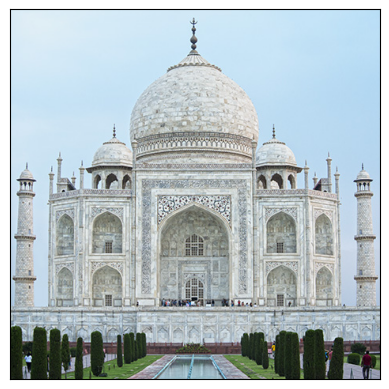

In [ ]:
plt.imshow(image) # Vemos la imagen
plt.xticks([])
plt.yticks([])
plt.show()

### Ejemplos de convolución

El siguiente kernel realiza la operación identidad.
El resultado de la convolución devuelve la imagen original, sin ningún cambio.

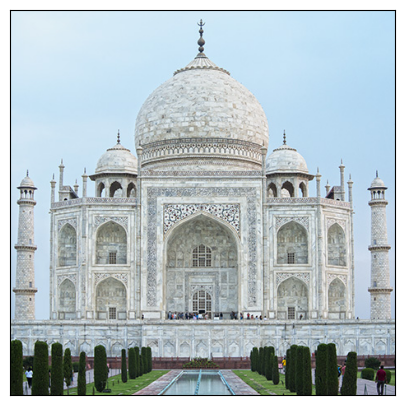

In [ ]:
identity_kernel = np.array([
    [0,0,0],
    [0,1,0],
    [0,0,0]
]) # Creación de un array 3x3, que usaremos como kernel (filtro)

img = cv2.filter2D(image, -1, identity_kernel) # función filter2D(imagen usada, parametro ddepth = -1 misma profunodad de bits de la imagen de salida, kernel definido que se aplica a la imagen)

fig, ax = plt.subplots(1, figsize=(5,5)) # Ploteamos
ax.set_xticks([])
ax.set_yticks([])
plt.imshow(img);

El siguiente filtro aplica el Box Blur (https://en.wikipedia.org/wiki/Box_blur), en el cual cada píxel de la imagen resultante tiene un valor igual al promedio de los valores de sus píxeles vecinos.


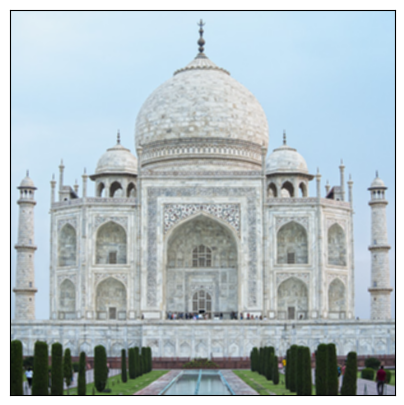

In [ ]:
box_blur_filter = (1/9) * np.array([
    [1,1,1],
    [1,1,1],
    [1,1,1]
]) # Este filtro deja el promedio de todos los pixeles dentro de una ventana, lo que genera es una perdida de calidad de la imagen

img = cv2.filter2D(image, -1, box_blur_filter) # Aplicamos el filtro sobre la imagen

fig, ax = plt.subplots(1, figsize=(5,5)) # Ploteamos
ax.set_xticks([])
ax.set_yticks([])
plt.imshow(img);

El siguiente ejemplo muestra un filtro ampliamente utilizado en el procesamiento digital de imágenes: el filtro gaussiano. (https://en.wikipedia.org/wiki/Gaussian_blur).

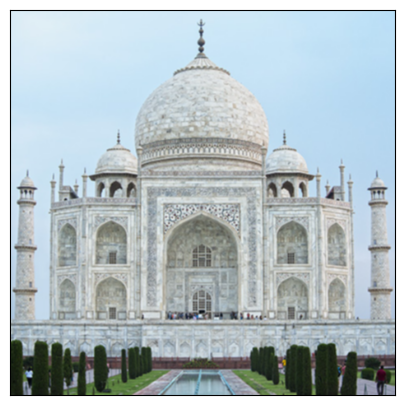

In [ ]:
gaussian_blur_filter = (1/16) * np.array([
    [1,2,1],
    [2,4,2],
    [1,2,1]
]) # Este filtro el promedio de todos los pixeles contiguos dandole mas peso a los del centro y menor peso a las esquinas (forma gausiana), se vera mejor en el centro que en los lados

img = cv2.filter2D(image, -1, gaussian_blur_filter) # Aplicamos el filtro sobre la imagen

fig, ax = plt.subplots(1, figsize=(5,5)) # Ploteamos
ax.set_xticks([])
ax.set_yticks([])
plt.imshow(img);

Podemos añadir ruido gaussiano a la imagen y observar sus efectos.

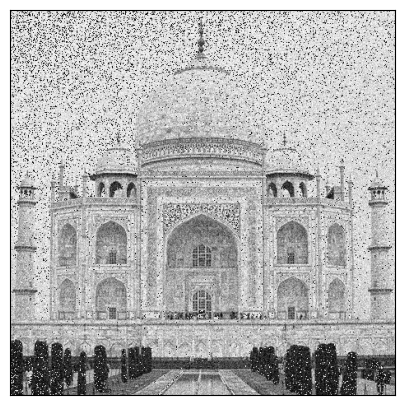

In [ ]:
sigma = 20 # Rudio
img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # Transformamos la imagen a escala de grises
n, m = img_gray.shape
img_noise = img_gray + sigma*np.random.randn(n, m) # Aplicación del ruido
fig, ax = plt.subplots(1, figsize=(5, 5))
ax.set_xticks([])
ax.set_yticks([])

plt.imshow(img_noise.astype(np.uint8), cmap='gray');

Ahora tenemos la imagen en blanco y negro con el ruido aplicado. Una manera de detectar el ruido de una imagen es mediante los filtros (kernels) vistos (Box Blur y Gaussiarn Blur).

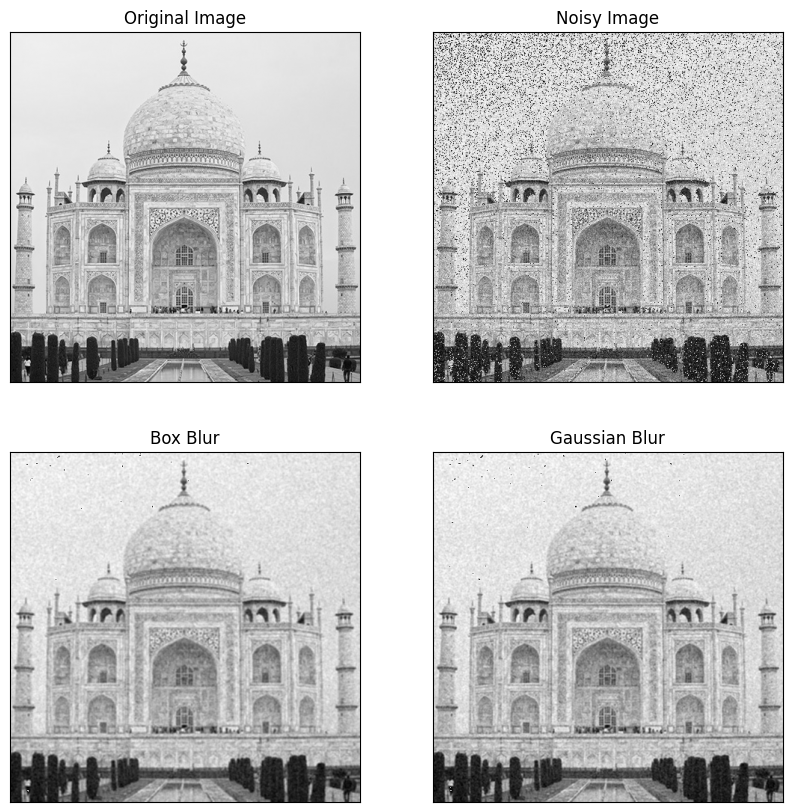

In [ ]:
img1 = cv2.filter2D(img_noise, -1, gaussian_blur_filter)

fig, ax = plt.subplots(2, 2, figsize=(10, 10))

for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):
        ax[i,j].set_xticks([])
        ax[i,j].set_yticks([])

ax[0, 0].set_title('Original Image')
ax[0, 0].imshow(img_gray.astype(np.uint8), cmap='gray'); # Imagen original transformada al tipo uint8 con la liberia numpy

ax[0, 1].set_title('Noisy Image')
ax[0, 1].imshow(img_noise.astype(np.uint8), cmap='gray'); # Muestra la imagen con el ruido aplicado

ax[1, 0].set_title('Box Blur')
ax[1, 0].imshow(cv2.filter2D(img_noise, -1, box_blur_filter).astype(np.uint8), cmap='gray'); # Muestra la imagen con ruido aplicandole el filtro box Blur para eliminar ese rudio

ax[1, 1].set_title('Gaussian Blur')
ax[1, 1].imshow(cv2.filter2D(img_noise, -1, gaussian_blur_filter).astype(np.uint8), cmap='gray'); # Muestra la imagen con ruido aplicandole el filtro Gaussian Blur para eliminar ese rudio

Se apercia la eliminación del rudio mediante los distintos kernels (filtros) tanto en Box Blur como Gaussian Blur.

El siguiente filtro se utiliza para la <b>detección de bordes</b> en imágenes.

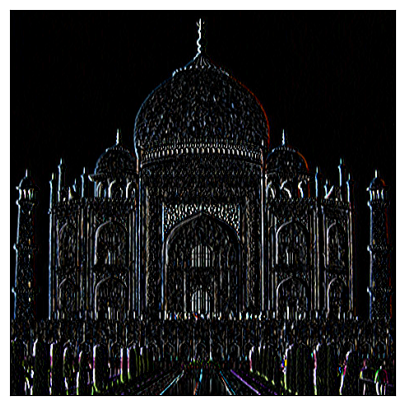

In [ ]:
edge_detection_filter = np.array([
    [1, 0, -1],
    [1, 0, -1],
    [1, 0, -1]
]) # Detecciónes verticales de los bordes

img = cv2.filter2D(image, -1, edge_detection_filter) # Aplicación del filtro

fig, ax = plt.subplots(1, figsize=(5, 5)) # Ploteado de la imagen con el filtro aplicado
plt.xticks([])
plt.yticks([])

plt.imshow(img);

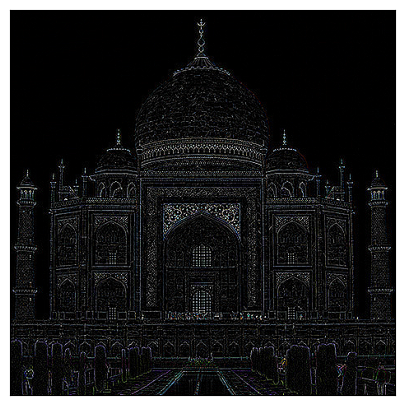

In [ ]:
edge_detection_filter = np.array([
    [0, 1, 0],
    [1, -4, 1],
    [0, 1, 0]
]) # detección horizontal de los border

img = cv2.filter2D(image, -1, edge_detection_filter) # Aplicación del filtro

fig, ax = plt.subplots(1, figsize=(5, 5)) # Ploteado de la imagen con el filtro
plt.xticks([])
plt.yticks([])

plt.imshow(img);

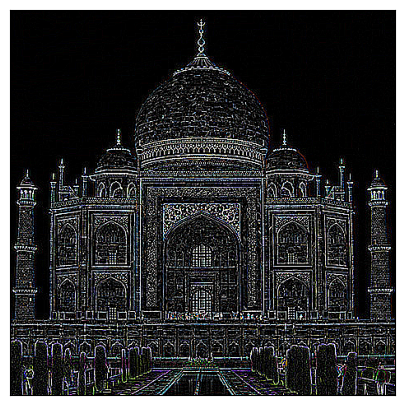

In [ ]:
edge_detection_filter = np.array([
    [1, 1, 1],
    [1, -8, 1],
    [1, 1, 1]
]) # Detección de ambos bordes, horizontal y vertical

img = cv2.filter2D(image, -1, edge_detection_filter) # Aplicación del filro

fig, ax = plt.subplots(1, figsize=(5, 5)) # Ploteado de la imagen con el filtro
plt.xticks([])
plt.yticks([])

plt.imshow(img);

El siguiente filtro permite resaltar los bordes de la imagen aumentando su contraste. El filtro es el resultado de restar la matriz de un filtro de detección de bordes de la matriz de un filtro identidad.

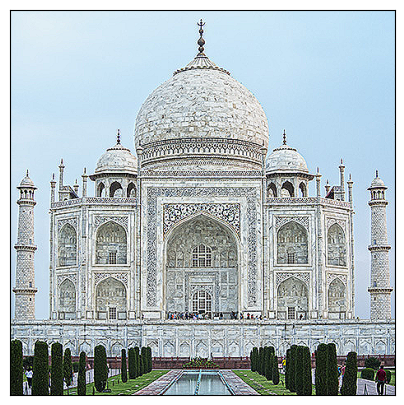

In [ ]:
sharpen_flter = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
]) # Creación de filtro dandole mayor contraste a los bordes

img = cv2.filter2D(image, -1, sharpen_flter)

fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])
plt.imshow(img);

OpenCV ofrece una gran variedad de técnicas para el procesamiento digital de imágenes.
Otros ejemplos de filtros que podemos aplicar a las imágenes son, por ejemplo, aquellos que permiten realizar [transformaciones morfológicas](https://docs.opencv.org/4.x/d9/d61/tutorial_py_morphological_ops.html).

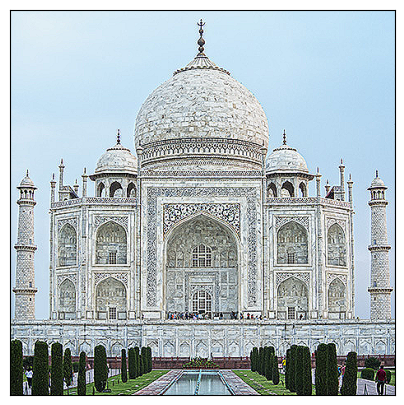

In [ ]:
kernel = np.ones((1, 1), np.uint8)
dilation = cv2.dilate(img, kernel, iterations=1)


fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])
plt.imshow(dilation)

## 2. <b>Clasificación de imágenes con redes neuronales convolucionales (CNN)</b>

En esta sección estudiaremos el problema de la clasificación de imágenes utilizando redes neuronales convolucionales (CNN). Para ello, nos basaremos en el [tutorial de TensorFlow](https://www.tensorflow.org/tutorials/images/classification).

Comenzaremos descargando el conjunto de datos.
Trabajaremos con un conjunto de aproximadamente 3700 fotografías de flores pertenecientes a 5 clases diferentes.

In [ ]:
import pathlib # Librería que ofrece lcases para representar rutas de sistemas
import os
import tensorflow as tf
dataset_url = 'https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz' # URL de los datos que vamos a usar
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url, untar=True) # Función utilizada para descargar y descomrpimir el arhivo que se encuentra en el URL
data_dir = pathlib.Path(data_dir) # Convierte la uta data_dir en un objeto path, mas manipulable

contents = os.listdir(data_dir) # utiliza la función listdir de la liberia os para obtener una lista de los nombres de los archivos

if "flower_photos" in contents and len(contents)==1: # Bucle que buscar si flowe_photos se encuentra en la lista contents (lista de nombres de arhcivos del directorio) y len de contents =1
  data_dir = os.path.join(data_dir,"flower_photos") # Selecciona en datadir donde el titulo sea flower_photos y lo vuelve a asignar a la carpeta data_dir
  data_dir = pathlib.Path(data_dir)

print(os.listdir(data_dir)) # Printea los nombres de data_dir

['sunflowers', 'tulips', 'dandelion', 'LICENSE.txt', 'daisy', 'roses']


Verificamos que tengamos todas las fotografías.

In [ ]:
image_count = len(list(data_dir.glob('*/*.jpg'))) # cuenta la longifut de la lista data_dir
print(image_count)

3670


Visualizamos algunas de ellas.

In [ ]:
roses = list(data_dir.glob('roses/*')) # crea una lista con la ruta de cada imagen de rosa en el subdirectorio roses de data_dir
sunflowers = list(data_dir.glob('sunflowers/*'))  # crea una lista con la ruta de cada imagen de sunflower en el subdirectorio sunflower de data_dir

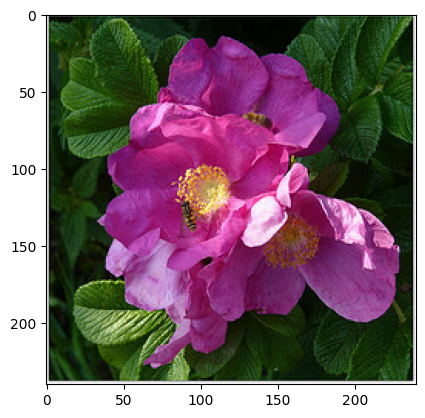

In [ ]:
im = read_image(str(roses[np.random.randint(0,len(roses))])) # Muestra una imagen aleatoria de la lista rosas
plt.imshow(im)

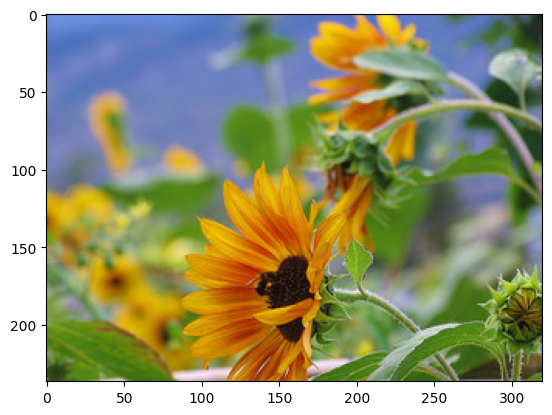

In [ ]:
im = read_image(str(sunflowers[np.random.randint(0,len(sunflowers))])) # Muestra una imagen aleatoria de la lista sunflowers
plt.imshow(im)

Creamos un conjunto de datos de TensorFlow con la información que hemos cargado previamente en el disco, utilizando el método `image_dataset_from_directory()`.

El parámetro ``color_mode`` (por defecto 'rgb') permite elegir la escala de color que se va a usar.
Para cargar y convertir automáticamente las imágenes a escala de grises, debe establecerse como: ``color_mode=grayscale``

Vamos a realziar el `train_test_split` para un conjunto de imagenes utilziando la libreria tensor flow

In [ ]:
image_size = (96,96) # Definimos una variable image_size, que seran los pixeles de la imagen
train_ds = tf.keras.preprocessing.image_dataset_from_directory(  # Creación de un objeto dataset para imagenes utilizando la función d keras image_dataset_from_directory
  data_dir, # datos usados
  validation_split=0.2, # Fracción de los datos reservados para la validación
  subset='training',  # Indica que se trata del conjunto de entrenamiento
  seed=1, # Misma partición de los datos todo el rato
  image_size=image_size, # medidas de las imagenes
  batch_size=64 # Cada lote de entrenamiento contendrá 64 imagenes
)

Found 3670 files belonging to 5 classes.
Using 2936 files for training.


In [ ]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory( # Creación de un objeto datasset para imagenes
  data_dir,
  validation_split=0.2,
  subset='validation', # Se trata del conjunto de validación
  seed=1,
  image_size=image_size,
  batch_size=64)

Found 3670 files belonging to 5 classes.
Using 734 files for validation.


In [ ]:
class_names_list = train_ds.class_names # Lista de las clases que se encuentran en el training dataset
class_names_list

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

### Configurar el conjunto de datos para un mejor rendimiento

Asegurémonos de usar almacenamiento en búfer con prefetching, para poder obtener los datos desde el disco sin que las operaciones de entrada/salida (I/O) bloqueen el proceso.
Estos son dos métodos importantes que debes usar al cargar datos en TensorFlow:

``Dataset.cache()``
Mantiene las imágenes en memoria después de cargarlas desde el disco durante la primera época (epoch).
Esto garantiza que el conjunto de datos no se convierta en un cuello de botella durante el entrenamiento del modelo.
Si el conjunto de datos es demasiado grande para almacenarlo completamente en memoria, también puedes usar este método para crear una caché eficiente en disco.

``Dataset.prefetch()``
Superpone el preprocesamiento de datos y la ejecución del modelo durante el entrenamiento, lo que mejora la eficiencia.

Los lectores interesados pueden aprender más sobre ambos métodos, así como sobre cómo almacenar datos en caché en disco, en la guía de rendimiento de datos de [TensorFlow](https://www.tensorflow.org/guide/data_performance#prefetching)..

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE # Permite que TensorFlow ajusta dinámicamente el número de elementos a precargar y el tamaño del búfer de operaciones, optimizando el uso de la CPU o GPU

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) # Aplica dichas automatizaciones al conjunto de datos de entrenamiento, shuffle sirve para barajarlo
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE) # Aplica dichas automatizaciones al conjunto de datos de validación

Visualización de algunas muestras de entrenamiento.

In [ ]:
images.shape, labels.shape

(TensorShape([64, 96, 96, 3]), TensorShape([64]))

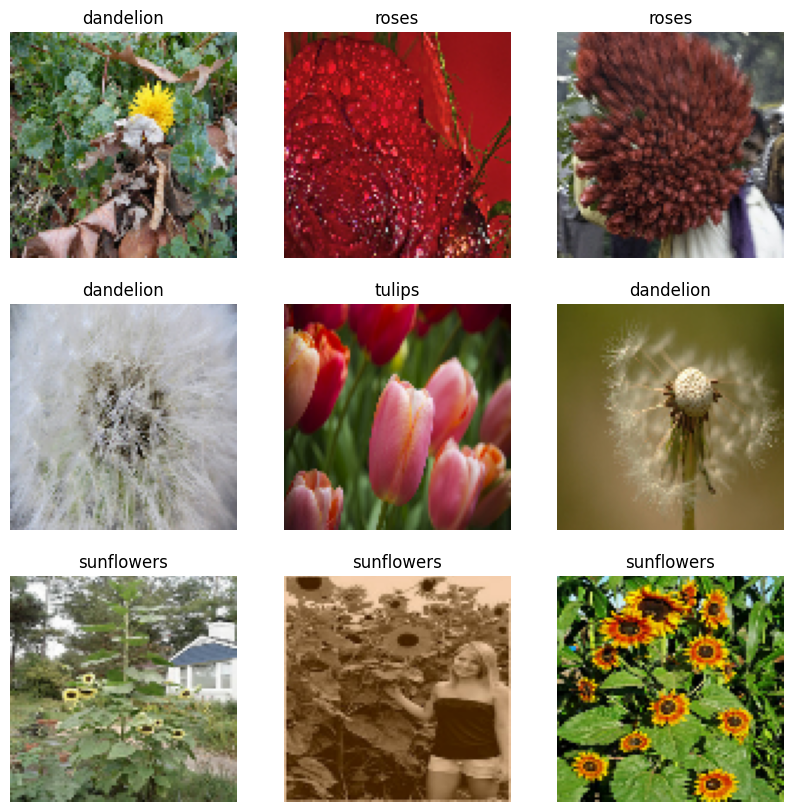

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10)) # Damos tamaño a los plots
for images, labels in train_ds.take(1): # Itera sobre el primer lote de train_ds usando la función take()
    for i in range(9): # para el rango de 9 plotea
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names_list[labels[i]])
        plt.axis("off")

Construimos el modelo.
La entrada tendrá una dimensión de (n, n, 3), que corresponde a (altura de la imagen, anchura de la imagen, número de canales de color).

En la entrada de la red incluimos un preprocesamiento que permite reescalar las imágenes, normalizando los valores de los píxeles a un rango entre 0 y 1.

In [ ]:
for image_batch, labels_batch in train_ds: # Inicia un bucle para iterar sobre elementos en train_ds, en cada iteración produce un image_batch (lote imagenes) y labels_batch (lote etiquetas)
    print(image_batch.shape) # Printea la forma de image_batch
    print(labels_batch.shape) # Printea la forma de labels_batch
    break

(64, 96, 96, 3)
(64,)


In [ ]:
# Imporrtación de librerias
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

## <b>3. Modelo CNN con Keras</b>


Una arquitectura de Red Neuronal Convolucional (CNN) tiene cuatro partes principales:

* <b>Capa convolucional:</b> extrae las características de la imagen de origen.
* <b>Capa de pooling (submuestreo):</b> reduce la dimensionalidad de la imagen sin perder características o patrones importantes.
* <b>Capa de aplanamiento (flattening):</b> transforma un tensor n-dimensional en un vector que puede introducirse en una red neuronal totalmente conectada.
* <b>Capa totalmente conectada (fully connected layer):</b> también conocida como capa densa (dense layer), se encarga de la clasificación final o de la predicción según las características extraídas.

#### <b>Reescalado</b>
Para convertir las imágenes al rango [0, 1], se utiliza una capa de reescalado en Keras

```python
normalization_layer = layers.Rescaling(1./255)
next_layer = normalization_layer(prev_layer)
```
o de forma más simple:
```python
reescaling = layers.Rescaling(1./255)(inputs)
```

#### <b>Capa convolucional</b>

En las capas convolucionales (Conv2D) configuraremos los siguientes parámetros:

* ``filters:`` número de mapas de características (feature maps) que la capa aprenderá.

* ``kernel_size:`` puede ser un número entero o una tupla de dos enteros. Especifica la altura y anchura del kernel (o filtro).

* ``padding:`` permite incluir relleno (padding) en los datos de entrada.

    * ``'valid':`` no aplica relleno.

    * ``'same':`` aplica el relleno necesario para que la dimensión de salida sea la misma que la de entrada.

* ``activation:`` función de activación utilizada. Se recomienda ReLU (Rectified Linear Unit) por su eficacia y simplicidad.

```python
tf.keras.layers.Conv2D(
    filters, kernel_size, strides=(1, 1), padding='valid',
    activation=None, kernel_regularizer=None)
```

com la API Funcional:
```python
next_layer = layers.Conv2D(filters=8, kernel_size=3, activation='relu', name='conv_1')(prev_layer)
```
Con la API Secuencial:
```python
model.add(layers.Conv2D(filters=8,kernel_size=3, activation='relu', name='conv_1'))
```
#### <b>Capa de pooling</b>

Una capa de pooling es una nueva capa que se agrega después de la capa convolucional.
Específicamente, después de aplicar una no linealidad (como ReLU), se puede elegir entre average pooling o max pooling.
Generalmente, max pooling es la mejor opción, ya que conserva las características más relevantes de la imagen.

Con la API Funcional:

```python
conv_1 = layers.Conv2D(filters=8, kernel_size=3, activation='relu', name='conv_1')(prev_layer)

pool_1 = layers.MaxPool2D(pool_size=(2, 2), name='pool_1')(conv_1)
```

Con la API Secuencial

```python
model.add(layers.AveragePooling2D(pool_size=(2, 2), name='pool_1'))
```

#### <b>Aplanamiento (Flattening)</b>

El aplanamiento prepara los datos en forma de vector para las capas totalmente conectadas (fully connected layers).

Con la API Funcional:
```python
next_layer = layers.Flatten(name='flatten')(prev_layer)
```

Con la API Secuencial
```python
model.add(layers.Flatten(name='flatten'))
```

También existe una alternativa al aplanamiento: un tipo especial de pooling llamado pooling global (global pooling).
llamado pooling global (global pooling).

El global pooling reduce (down-samplea) todo el mapa de características a un solo valor por canal.

Puedes elegir entre:
* ``GlobalAveragePooling2D:`` calcula el promedio de cada mapa de características.

* ``GlobalMaxPooling2D:`` toma el valor máximo de cada mapa de características.

```python
model.add(layers.GlobalMaxPool2D(name='GlobalMaxPooling2D'))
```
#### <b> Capa totalmente conectada (Fully-connected layer)</b>

La capa densa (Dense layer) funciona como una red neuronal simple, en la que cada neurona está conectada con todas las neuronas de la capa anterior.
Estas capas se utilizan al final de una CNN para realizar la clasificación o predicción final, combinando las características extraídas por las capas convolucionales y de pooling.

### 3.1. Construcción del modelo

In [ ]:
# Capa de input
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
reescaling = layers.Rescaling(1. / 255)(inputs) # Define una capa de reescalado.

conv_1 = layers.Conv2D(4, 3, padding='valid', activation='relu', # Primera capa convolucional
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_1')(conv_1) # Primera Capa de Pooling


conv_2 = layers.Conv2D(4, 3, padding='valid', activation='relu',# Segunda capa convolucional
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2) # Segunda capas de Pooling

# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2)
dense = layers.Dense(64, activation='relu', name='dense')(flat)
outputs = layers.Dense(5, activation='softmax', name='output')(dense) # Capa densa

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

In [ ]:
model.summary()

Model: "cnn_example"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_3 (Rescaling)         │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_1 (Conv2D)                 │ (None, 94, 94, 4)      │           112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_1 (MaxPooling2D)           │ (None, 47, 47, 4)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2 (Conv2D)                 │ (None, 45, 45, 4)      │           148 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_2 (MaxPooling2D)           │ (None, 22, 22, 4)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1936)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       123,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 124,553 (486.54 KB)

 Trainable params: 124,553 (486.54 KB)

 Non-trainable params: 0 (0.00 B)

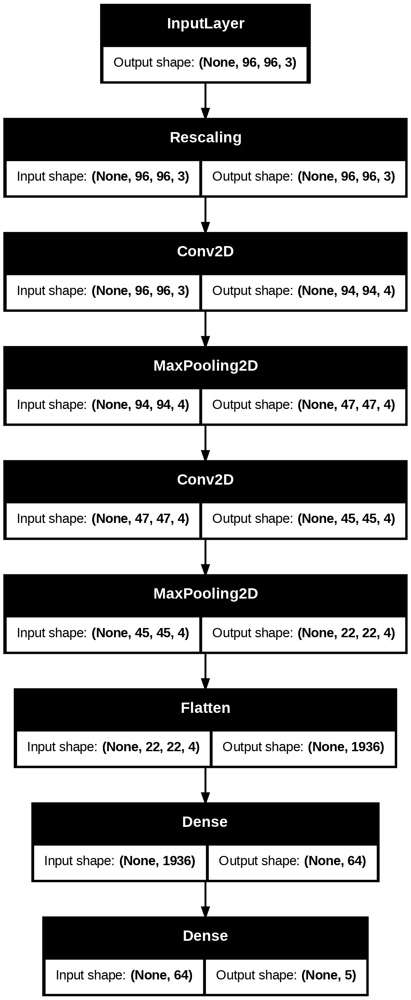

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True)

### 3.2. Compilación del modelo

In [ ]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(), # Estamos haciendo un one-hot-encoding
    metrics=['accuracy'] # metrica
)

###3.3. Entrenamiento del modelo

In [ ]:
epochs = 8
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
)

Epoch 1/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step - accuracy: 0.2823 - loss: 1.6828 - val_accuracy: 0.3597 - val_loss: 1.4092
Epoch 2/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.3905 - loss: 1.3799 - val_accuracy: 0.4469 - val_loss: 1.3040
Epoch 3/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4909 - loss: 1.2418 - val_accuracy: 0.5014 - val_loss: 1.2053
Epoch 4/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5577 - loss: 1.1094 - val_accuracy: 0.5531 - val_loss: 1.1208
Epoch 5/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5613 - loss: 1.1091 - val_accuracy: 0.5531 - val_loss: 1.1066
Epoch 6/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5875 - loss: 1.0470 - val_accuracy: 0.5640 - val_loss: 1.0823
Epoch 7/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6071 - loss: 1.0078 - val_accuracy: 0.5695 - val_loss: 1.0678
Epoch 8/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6323 - loss: 0.9691 - val_accuracy: 0.5695 - val_loss: 1.086

### 3.4. Visualización de los resultados

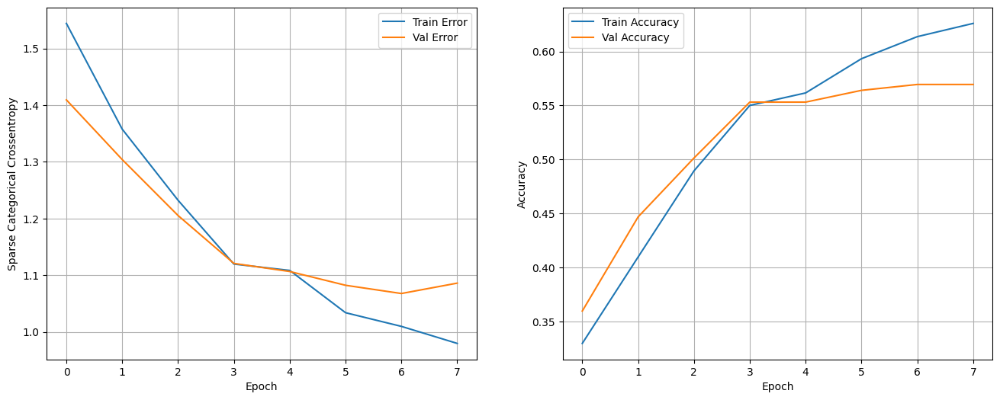

In [ ]:
import pandas as pd
def show_loss_accuracy_evolution(history):

    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Sparse Categorical Crossentropy')
    ax1.plot(hist['epoch'], hist['loss'], label='Train Error')
    ax1.plot(hist['epoch'], hist['val_loss'], label = 'Val Error')
    ax1.grid()
    ax1.legend()

    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.plot(hist['epoch'], hist['accuracy'], label='Train Accuracy')
    ax2.plot(hist['epoch'], hist['val_accuracy'], label = 'Val Accuracy')
    ax2.grid()
    ax2.legend()

    plt.show()

show_loss_accuracy_evolution(history)

### 3.5. Ploteado de los malos resultados

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step 


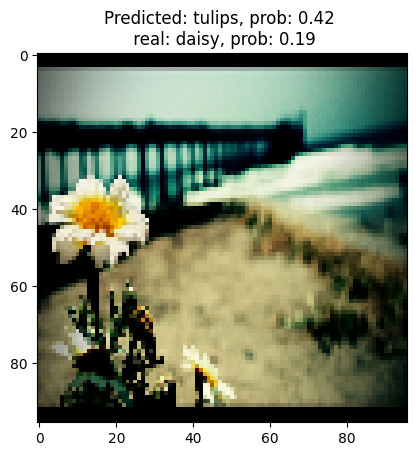

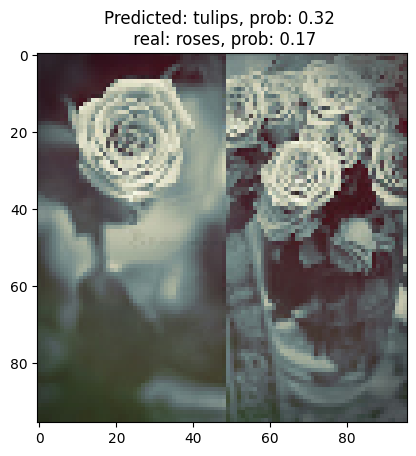

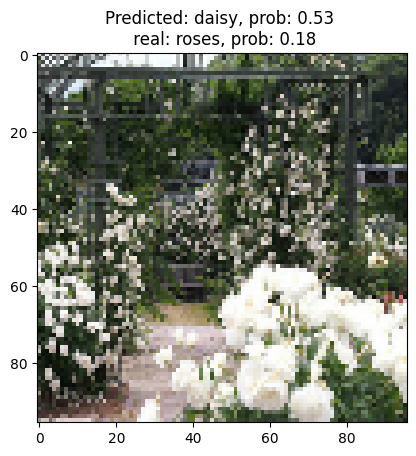

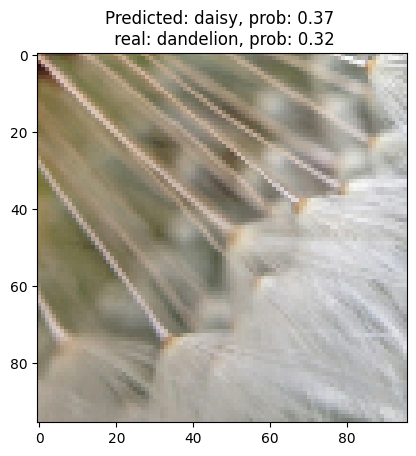

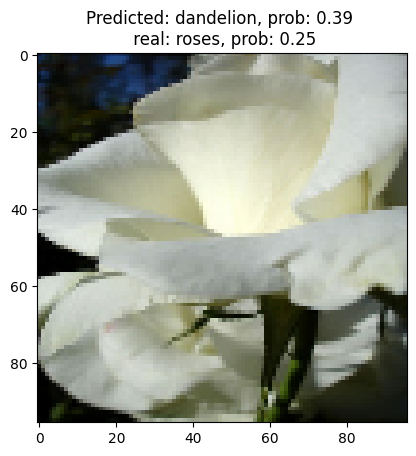

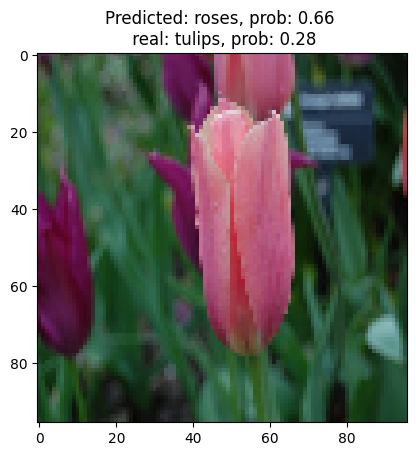

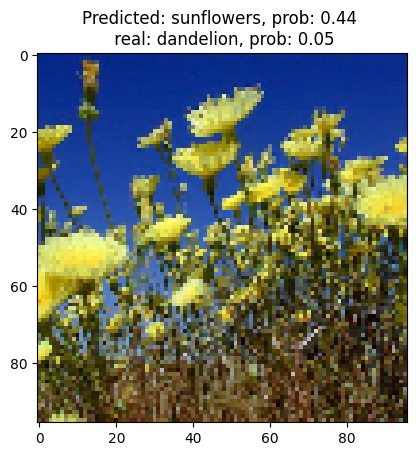

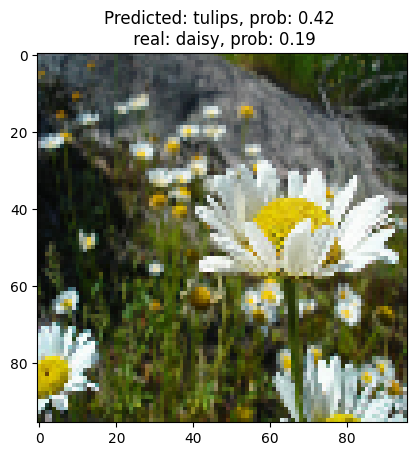

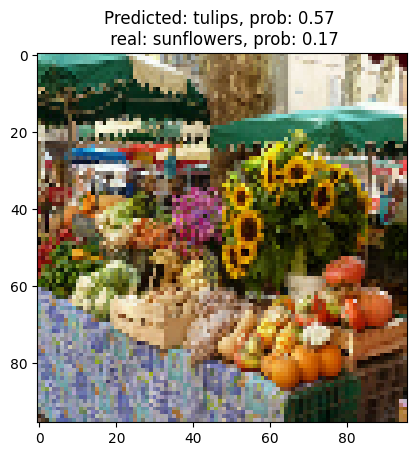

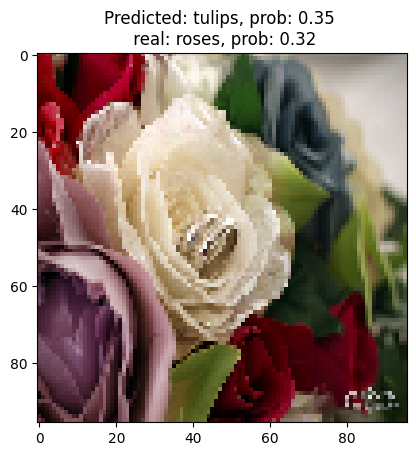

In [ ]:
def show_errors(val_ds, model, class_names_list, n_images=10):
    n_plots = 0
    for images, labels in val_ds:
        pred_probs = model.predict(images)
        preds = pred_probs.argmax(axis=-1)
        bad_pred_inds = np.where(preds != labels)[0]
        for ind in list(bad_pred_inds):
            n_plots += 1
            real_class = class_names_list[labels[ind].numpy()]
            pred_class = class_names_list[preds[ind]]
            prob = pred_probs[ind].max()
            prob_real = pred_probs[ind][[
                i for i, c in enumerate(class_names_list) if c == real_class
            ][0]]
            plt.imshow(images[ind].numpy().astype("uint8"))
            plt.title(
                'Predicted: {0}, prob: {1:.2f} \n real: {2}, prob: {3:.2f}'
                .format(pred_class, prob, real_class, prob_real))
            plt.show()

            if n_plots == n_images:
                return
    return


show_errors(val_ds, model, class_names_list, n_images=10)

### Pregunta 1: ¿Qué sucede con la pérdida de validación y con el número de parámetros si se incrementa el número de filtros y el tamaño del kernel?

Model: "cnn_example"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_4 (Rescaling)         │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_1 (Conv2D)                 │ (None, 94, 94, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_1 (MaxPooling2D)           │ (None, 47, 47, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2 (Conv2D)                 │ (None, 45, 45, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_2 (MaxPooling2D)           │ (None, 22, 22, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 7744)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       495,680 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 498,773 (1.90 MB)

 Trainable params: 498,773 (1.90 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.3453 - loss: 1.4765 - val_accuracy: 0.5559 - val_loss: 1.1116
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5725 - loss: 1.0621 - val_accuracy: 0.5926 - val_loss: 1.0451
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6346 - loss: 0.9325 - val_accuracy: 0.6049 - val_loss: 1.0182
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6509 - loss: 0.8912 - val_accuracy: 0.6349 - val_loss: 0.9799
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7012 - loss: 0.7944 - val_accuracy: 0.6213 - val_loss: 1.0017
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7304 - loss: 0.7323 - val_accuracy: 0.6499 - val_loss: 0.9235
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7786 - loss: 0.6107 - val_accuracy: 0.6485 - val_loss: 0.9519
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8049 - loss: 0.5784 - val_accuracy: 0.6485 - val

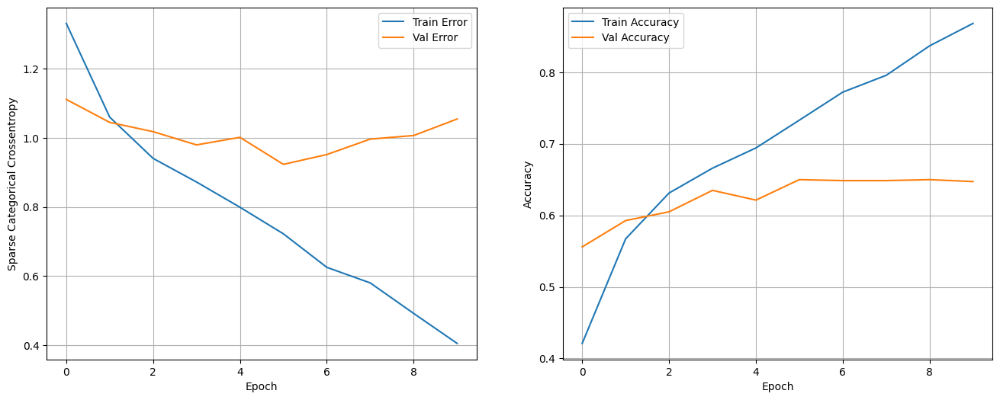

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
reescaling = layers.Rescaling(1. / 255)(inputs)

# Conv Layer 1
conv_1 = layers.Conv2D(filters=16, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_1')(conv_1)

# Conv Layer 2
conv_2 = layers.Conv2D(filters=16, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2)


# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2)
dense = layers.Dense(64, activation='relu', name='dense')(flat)
outputs = layers.Dense(5, activation='softmax', name='output')(dense)

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

print(model.summary())

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

epochs = 10
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
)
show_loss_accuracy_evolution(history)

### Pregunta 2: ¿Qué sucede con la pérdida de validación y con el número de parámetros si se varía el pool_size (tamaño del agrupamiento) y el padding (relleno) de los filtros a same?

Model: "cnn_example"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_5 (Rescaling)         │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_1 (Conv2D)                 │ (None, 94, 94, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_1 (MaxPooling2D)           │ (None, 47, 47, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2 (Conv2D)                 │ (None, 45, 45, 4)      │           580 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_2 (MaxPooling2D)           │ (None, 22, 22, 4)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1936)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       123,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 125,321 (489.54 KB)

 Trainable params: 125,321 (489.54 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - accuracy: 0.3238 - loss: 1.4915 - val_accuracy: 0.4510 - val_loss: 1.3303
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.4900 - loss: 1.2563 - val_accuracy: 0.5000 - val_loss: 1.1858
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5960 - loss: 1.0761 - val_accuracy: 0.5354 - val_loss: 1.1366
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6300 - loss: 0.9724 - val_accuracy: 0.5858 - val_loss: 1.0490
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6853 - loss: 0.8447 - val_accuracy: 0.5531 - val_loss: 1.0849
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7386 - loss: 0.7508 - val_accuracy: 0.5858 - val_loss: 1.0670
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7817 - loss: 0.6369 - val_accuracy: 0.5913 - val_loss: 1.0854
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8240 - loss: 0.5565 - val_accuracy: 0.5627 - val

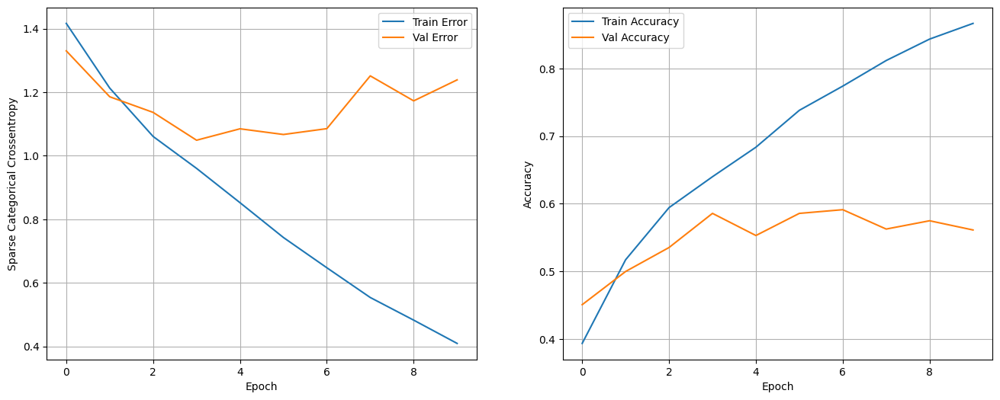

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
reescaling = layers.Rescaling(1. / 255)(inputs)

# Conv Layer 1
conv_1 = layers.Conv2D(filters=16, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(2,2), name='pool_1')(conv_1)

# Conv Layer 2
conv_2 = layers.Conv2D(4, 3, padding='valid', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2)

# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2)
dense = layers.Dense(64, activation='relu', name='dense')(flat)
outputs = layers.Dense(5, activation='softmax', name='output')(dense)

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

print(model.summary())

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

epochs = 10
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
)
show_loss_accuracy_evolution(history)

### Pregunta 3: Crea un modelo con una precisión de validación (val_accuracy) superior a $0.72$.

*Puedes* usar la técnica de early-stopping (detención temprana) y las técnicas de dropout (abandono).
```python
next_layer = layers.Dropout(0.4)(prev_layer)
```

```python
next_layer = layers.BatchNormalization()(prev_layer)
```

```python
es_callback = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # can be 'val_accuracy'
    patience=5,  # if during 5 epochs there is no improvement in `val_loss`, the execution will stop
    verbose=1)
```

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input') # Capa de entrada
reescaling = layers.Rescaling(1. / 255)(inputs) # Capa de reescalado

# Conv Layer 1
conv_1 = layers.Conv2D(filters=64, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_1')(reescaling)  # Capa convolucional
pool_1 = layers.MaxPooling2D(pool_size=(2,2), name='pool_1')(conv_1) # Capa de pooling

# Conv Layer 2
conv_2 = layers.Conv2D(filters=64, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_2')(pool_1)  # Capa convolucional
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2) # Capa de pooling

# Conv Layer 3
conv_3 = layers.Conv2D(filters=64, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_3')(pool_2) # Capa convolucional
pool_3 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_3')(conv_3) # Capa de pooling

# Conv Layer 4
conv_4 = layers.Conv2D(filters=64, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_4')(pool_3) # Capa convolucional
pool_4 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_4')(conv_4) # Capa de pooling

# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_3) # Capa de flatten
dense = layers.Dense(64, activation='relu', name='dense')(flat) # Capa densa

outputs = layers.Dense(5, activation='softmax', name='output')(dense) # Capa de ouptut
model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example') # Definición del modelo


In [ ]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

Epoch 1/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - accuracy: 0.3558 - loss: 1.4283 - val_accuracy: 0.5804 - val_loss: 1.0728
Epoch 2/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.5760 - loss: 1.0693 - val_accuracy: 0.6335 - val_loss: 0.9647
Epoch 3/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.6328 - loss: 0.9327 - val_accuracy: 0.6526 - val_loss: 0.9161
Epoch 4/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.6962 - loss: 0.8121 - val_accuracy: 0.5926 - val_loss: 1.0483
Epoch 5/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.7127 - loss: 0.7314 - val_accuracy: 0.6689 - val_loss: 0.8929
Epoch 6/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.7604 - loss: 0.6317 - val_accuracy: 0.6866 - val_loss: 0.8822
Epoch 7/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.7885 - loss: 0.5674 - val_accuracy: 0.7098 - val_loss: 0.7911
Epoch 8/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8230 - loss: 0.4601 - val_accuracy: 0.6962 -

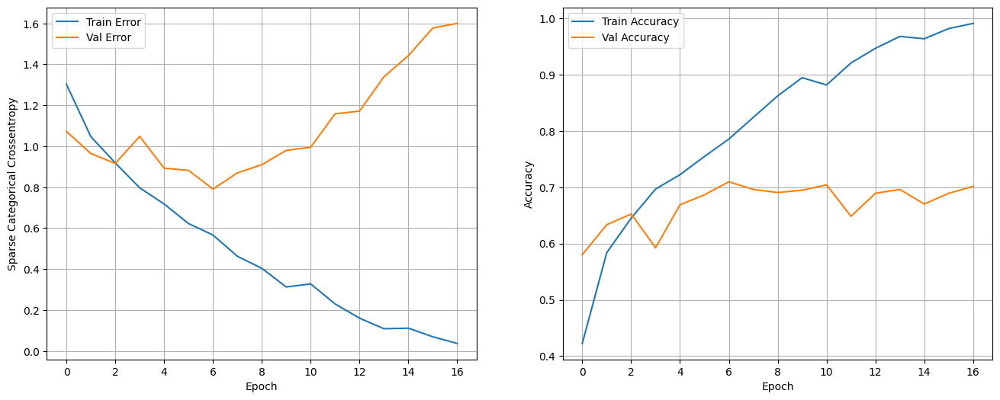

In [ ]:
es_callback = keras.callbacks.EarlyStopping( # Método para mejorar el modelo
    monitor='val_loss',  # can be 'val_accuracy'
    patience=10,  # si en 11 epocas no hay mejora, la validación se para
    verbose=1)


epochs = 25
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[es_callback]
)

show_loss_accuracy_evolution(history)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step 


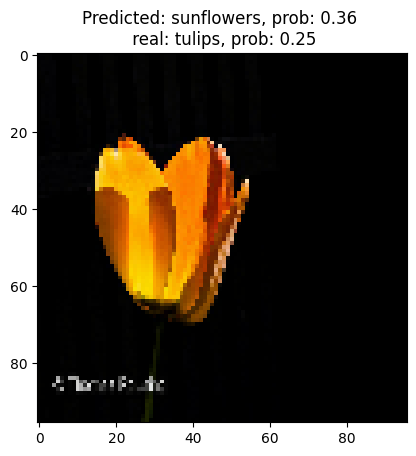

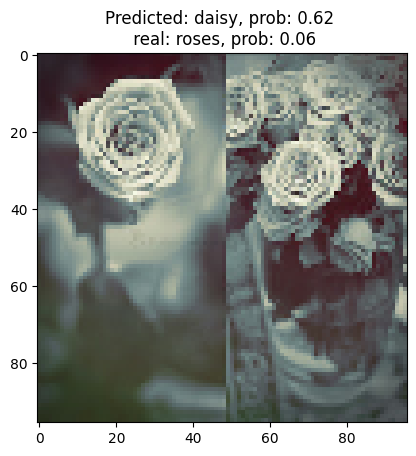

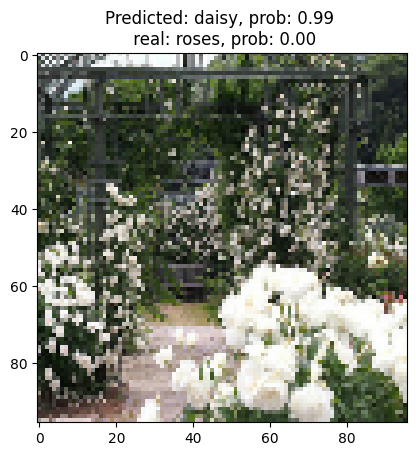

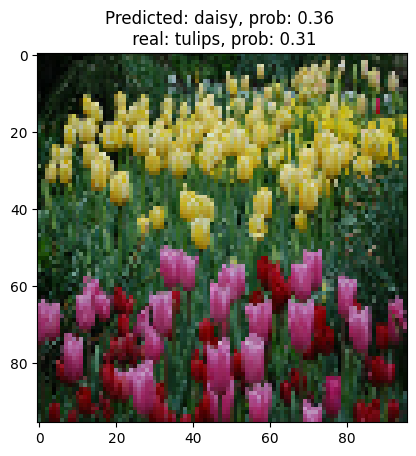

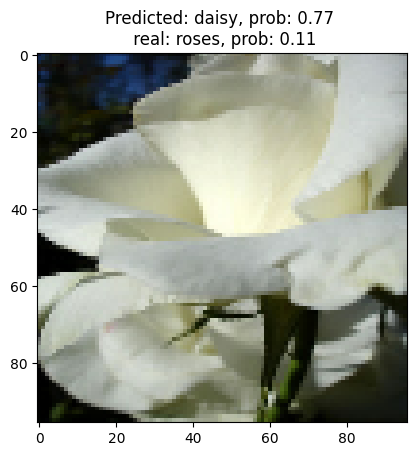

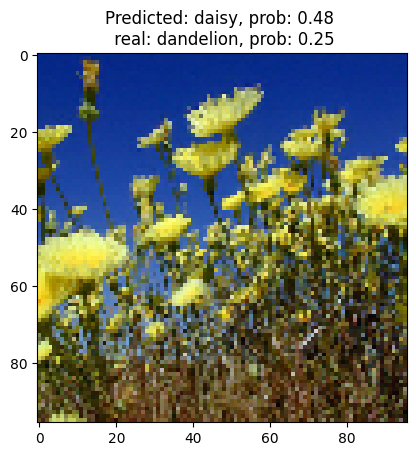

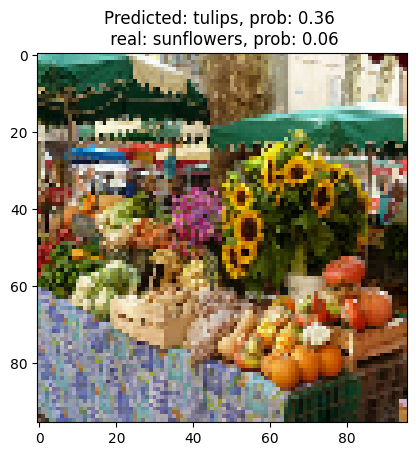

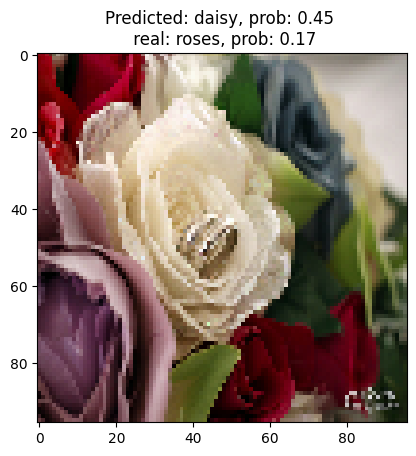

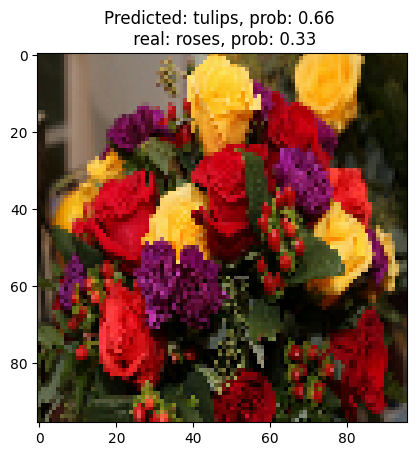

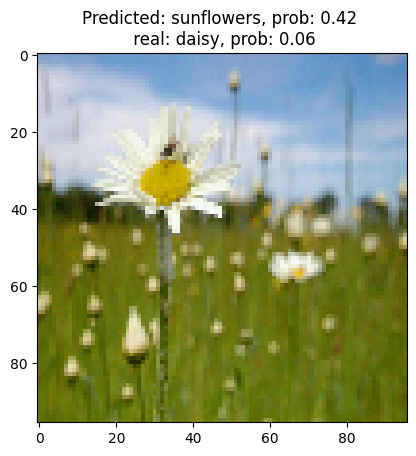

In [ ]:
show_errors(val_ds, model, class_names_list, n_images=10)

## <b>4. Aumento de datos</b>

Transformamos aleatoriamente las imágenes de entrenamiento.

El aumento de datos puede realizarse antes de comenzar cualquier entrenamiento, directamente sobre el conjunto de imágenes disponible, o trabajando con las capas de Keras destinadas a tal fin. En este ejemplo, lo haremos de la segunda manera, rotando, volteando y escalando las imágenes de forma aleatoria.

In [ ]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal_and_vertical"), # capa de volteo aleatorio, tanto en el eje vertical como en el horizontal
    layers.RandomRotation(0.25), # capa de rotación aleatorio en un rango 0,25
    layers.RandomZoom(0.25), # Capa de zoom aleatorio
    layers.RandomContrast(0.1), # Capa de contraste aleatorio
    layers.RandomBrightness(factor=0.2) # Capa de brillo aleatorio
  ]
)

Algunos ejemplos

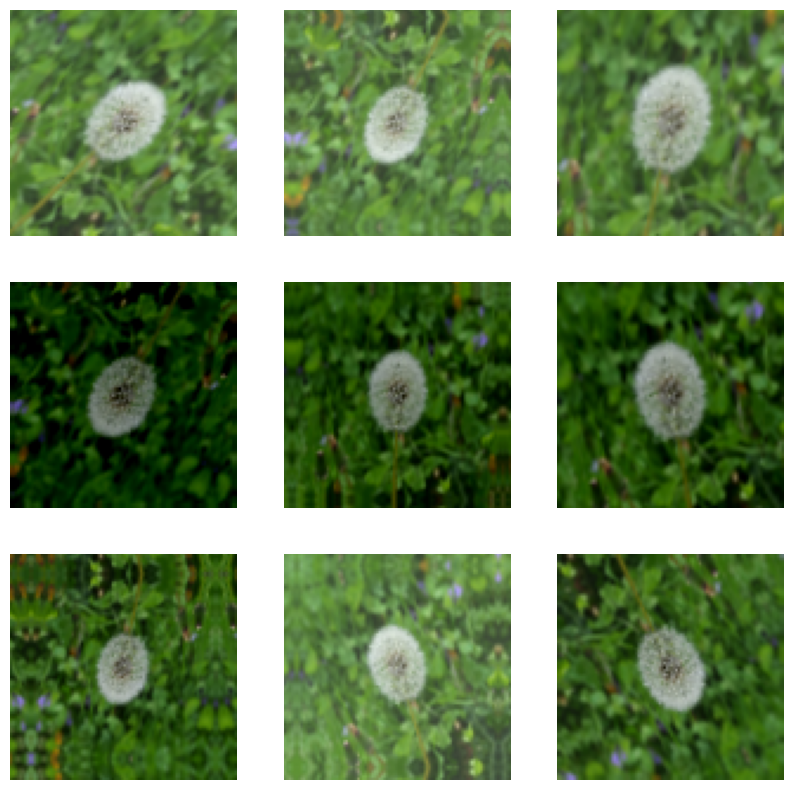

In [ ]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images, training=True)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

Incluimos la etapa que realiza las transformaciones en las imágenes al comienzo del modelo que construimos previamente, repetimos el entrenamiento y visualizamos los resultados.

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
data_aug = layers.RandomFlip("horizontal_and_vertical")(inputs) # data_augmentation(inputs) para usar todos
reescaling = layers.Rescaling(1. / 255)(data_aug)

# Conv Layer 1
conv_1 = layers.Conv2D(8, 3, padding='valid', activation='relu',
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_1')(conv_1)

# Conv Layer 2
conv_2 = layers.Conv2D(8, 3, padding='valid', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(name='pool_2')(conv_2)

# Conv Layer 3
conv_3 = layers.Conv2D(8,
                       3,
                       padding='valid',
                       activation='relu',
                       name='conv_3')(pool_2)
pool_3 = layers.MaxPooling2D(name='pool_3')(conv_3)

# Fully-connected
flat = layers.Flatten(name='flatten')(pool_3)
dense = layers.Dense(64, activation='relu', name='dense')(flat)
outputs = layers.Dense(5, activation='softmax', name='output')(dense)

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

In [ ]:
es_callback = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # can be 'val_accuracy'
    patience=10,  # if during 5 epochs there is no improvement in `val_loss`, the execution will stop
    verbose=1)

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

epochs = 10
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[es_callback]
)

Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - accuracy: 0.3038 - loss: 1.5498 - val_accuracy: 0.4278 - val_loss: 1.3424
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4572 - loss: 1.2798 - val_accuracy: 0.5477 - val_loss: 1.0944
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5318 - loss: 1.1039 - val_accuracy: 0.5736 - val_loss: 1.0668
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5636 - loss: 1.0568 - val_accuracy: 0.5940 - val_loss: 1.0206
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5913 - loss: 1.0154 - val_accuracy: 0.5858 - val_loss: 1.0012
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5908 - loss: 0.9828 - val_accuracy: 0.6063 - val_loss: 0.9888
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5983 - loss: 0.9744 - val_accuracy: 0.6063 - val_loss: 0.9743
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6157 - loss: 0.9536 - val_accuracy: 0.6063 - val_loss

Pregunta 4: Utiliza el mejor modelo que hayas encontrado e incluye la capa de aumento de datos (data_aug), compara los resultados.

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
data_aug = data_augmentation(inputs)
reescaling = layers.Rescaling(1. / 255)(data_aug)

# Conv Layer 1
conv_1 = layers.Conv2D(filters=64, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_1')(reescaling)  # Capa convolucional
pool_1 = layers.MaxPooling2D(pool_size=(2,2), name='pool_1')(conv_1) # Capa de pooling

# Conv Layer 2
conv_2 = layers.Conv2D(filters=64, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_2')(pool_1)  # Capa convolucional
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2) # Capa de pooling

# Conv Layer 3
conv_3 = layers.Conv2D(filters=64, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_3')(pool_2) # Capa convolucional
pool_3 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_3')(conv_3) # Capa de pooling

# Conv Layer 4
conv_4 = layers.Conv2D(filters=64, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_4')(pool_3) # Capa convolucional
pool_4 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_4')(conv_4) # Capa de pooling

# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_3) # Capa de flatten
dense = layers.Dense(64, activation='relu', name='dense')(flat) # Capa densa

outputs = layers.Dense(5, activation='softmax', name='output')(dense) # Capa de ouptut
model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example') # Definición del modelo


Epoch 1/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.3107 - loss: 1.4802 - val_accuracy: 0.5082 - val_loss: 1.1781
Epoch 2/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.4912 - loss: 1.1744 - val_accuracy: 0.5368 - val_loss: 1.1756
Epoch 3/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.5442 - loss: 1.1080 - val_accuracy: 0.5123 - val_loss: 1.2547
Epoch 4/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.5933 - loss: 1.0256 - val_accuracy: 0.5981 - val_loss: 1.0854
Epoch 5/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.6098 - loss: 0.9674 - val_accuracy: 0.6104 - val_loss: 1.0367
Epoch 6/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.6310 - loss: 0.9177 - val_accuracy: 0.6322 - val_loss: 1.0358
Epoch 7/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.6311 - loss: 0.9028 - val_accuracy: 0.6362 - val_loss: 0.9524
Epoch 8/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.6670 - loss: 0.8386 - val_accuracy: 0.6035 - v

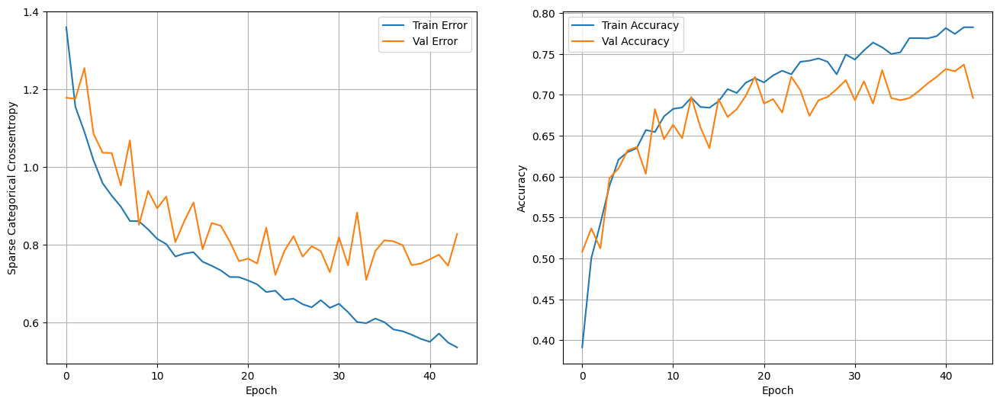

In [ ]:
es_callback = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # can be 'val_accuracy'
    patience=10,  # if during 5 epochs there is no improvement in `val_loss`, the execution will stop
    verbose=1)
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

epochs = 50
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[es_callback]
)
show_loss_accuracy_evolution(history)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step 


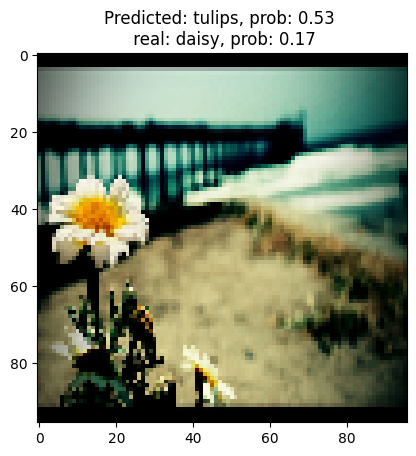

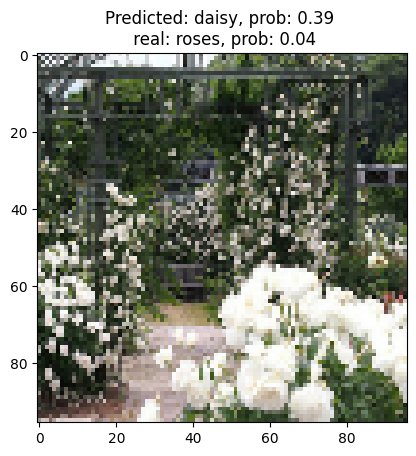

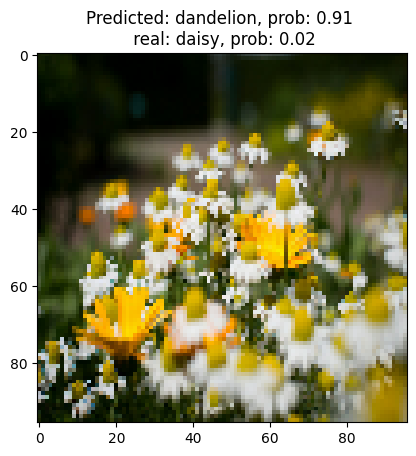

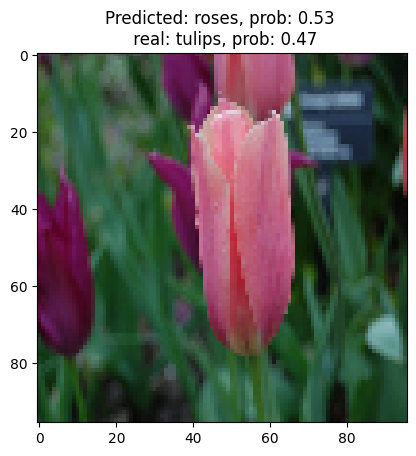

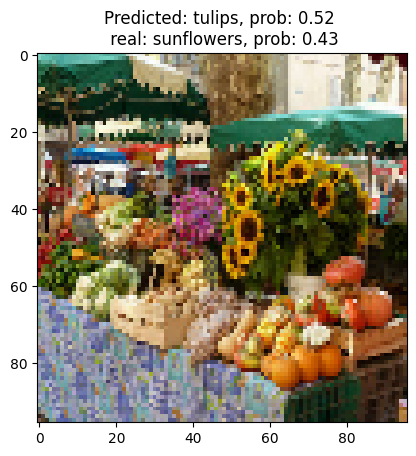

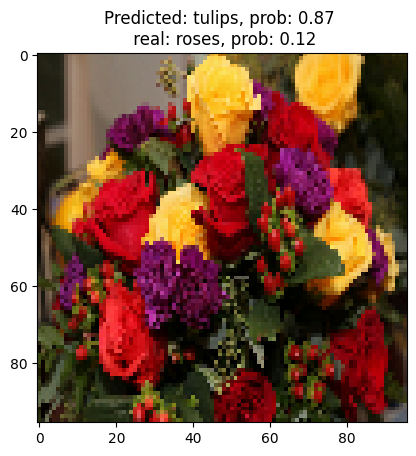

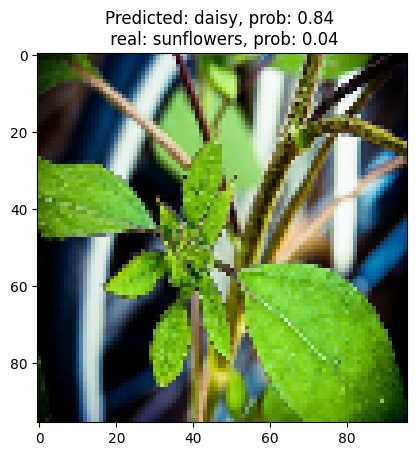

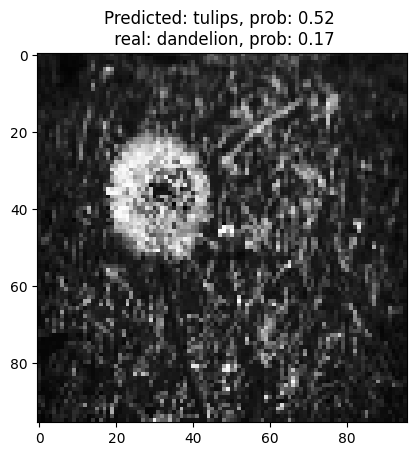

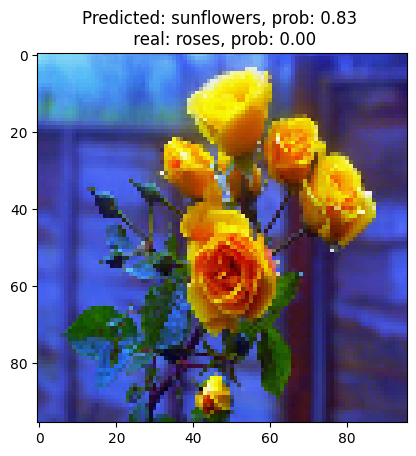

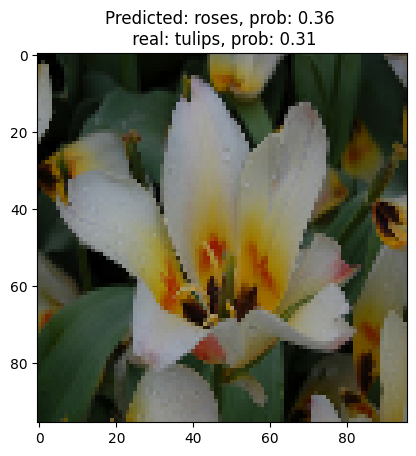

In [ ]:
show_errors(val_ds, model, class_names_list, n_images=10)

## <b>5. Transfer Learning (Aprendizaje por Transferencia)</b>

Con el aprendizaje por transferencia, te beneficias tanto de las arquitecturas avanzadas de redes neuronales convolucionales desarrolladas por los principales investigadores como del preentrenamiento en un enorme conjunto de datos de imágenes. En nuestro caso, haremos aprendizaje por transferencia a partir de una red entrenada en ImageNet, una base de datos de imágenes que contiene muchas plantas y escenas al aire libre, lo cual es lo suficientemente parecido a las flores.

[MobileNetV2](https://arxiv.org/abs/1801.04381) es una mejora significativa con respecto a MobileNetV1 y lleva el estado del arte para el reconocimiento visual en dispositivos móviles, incluyendo la clasificación, la detección de objetos y la segmentación semántica.

En [$tf.keras.applications$ ](https://www.tensorflow.org/api_docs/python/tf/keras/applications) tienes muchos modelos preentrenados. Puedes compararlos [aquí](https://keras.io/api/applications/#available-models).

Con el parámetro `include\_top=False`, puedes eliminar la última capa ``softmax``.

Con ``pretrained\_model.trainable = False, congelas los pesos del modelo preentrenado.

In [ ]:
pretrained_model = keras.applications.MobileNetV2(  # Cargar un modelo preentrenado de keras llamado MobileNetV2
    input_shape = None, #Define la forma de la imagen de entrada, al poner None es la predeterminada con imagenet
    alpha=1.0, #Controla el número de filtros en el modelo. 1 es el predeterminado que utiliza el modelo con el ancho completo
    include_top=True, # Indica si se incluye la caoa de clasificación densa, True que se carga
    weights = "imagenet", # Carga los pesos que fueron entrenados previamente en el enorme conjunto de datos ImageNet
    input_tensor = None,  # Para usar como entrada de las capas del modelo
    pooling = None, #tipo de agrupamiento de pooling
    classes = 1000, # numero de clases de salida
    classifier_activation = 'softmax', # Función de activación de la ultima capa
    name=None
)

14536120/14536120 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
pretrained_model = tf.keras.applications.MobileNetV2(input_shape=image_size+(3,), include_top=False)
pretrained_model.trainable = False
pretrained_model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "mobilenetv2_1.00_96"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 96, 96, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 48, 48,    │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 48, 48,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 48, 48,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 48, 48,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 48, 48,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 48, 48,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 48, 48,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 48, 48,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 49, 49,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 24, 24,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 24, 24,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 24, 24,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 24, 24,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

Necesitamos usar el mismo preprocesamiento que en el modelo.

In [ ]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

Definimos el nuevo modelo añadiendole capas

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')

# pre-trained model
x = preprocess_input(inputs)
x = pretrained_model(x)

# classifier
flat = tf.keras.layers.Flatten()(x)
flat = tf.keras.layers.Dropout(0.5)(flat)
outputs = tf.keras.layers.Dense(5, activation='softmax')(flat)

model_tl = tf.keras.Model(inputs, outputs)
model_tl.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_96             │ (None, 3, 3, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 11520)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 11520)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 5)              │        57,605 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,315,589 (8.83 MB)

 Trainable params: 57,605 (225.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
model_tl.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

In [ ]:
epochs = 5
history = model_tl.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 48s 670ms/step - accuracy: 0.6441 - loss: 1.3843 - val_accuracy: 0.8610 - val_loss: 0.6065
Epoch 2/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8878 - loss: 0.3851 - val_accuracy: 0.8610 - val_loss: 0.5888
Epoch 3/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.9309 - loss: 0.1976 - val_accuracy: 0.8569 - val_loss: 0.6175
Epoch 4/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.9587 - loss: 0.1255 - val_accuracy: 0.8733 - val_loss: 0.6103
Epoch 5/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9574 - loss: 0.1124 - val_accuracy: 0.8651 - val_loss: 0.6178


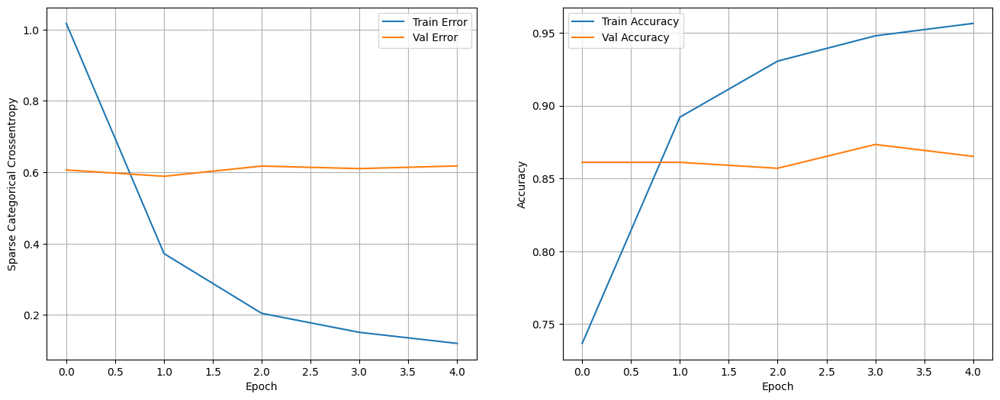

In [ ]:
show_loss_accuracy_evolution(history)

2/2 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step


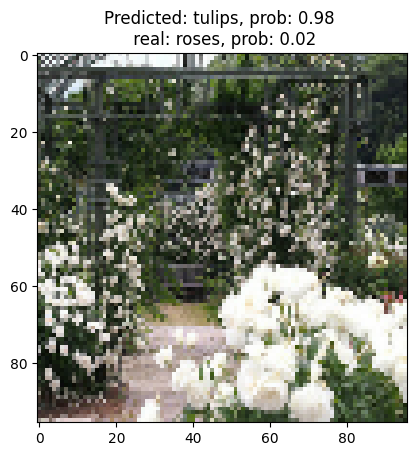

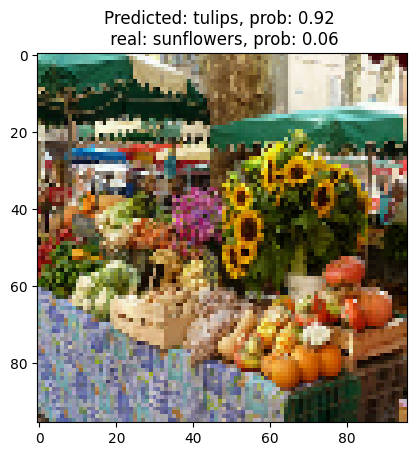

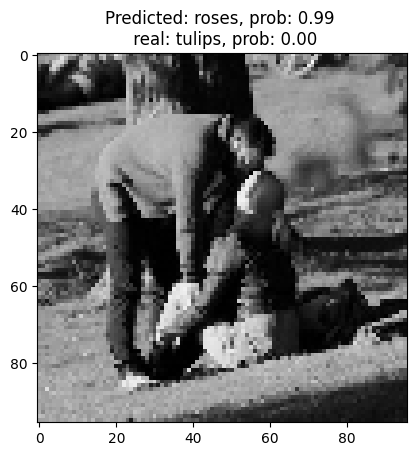

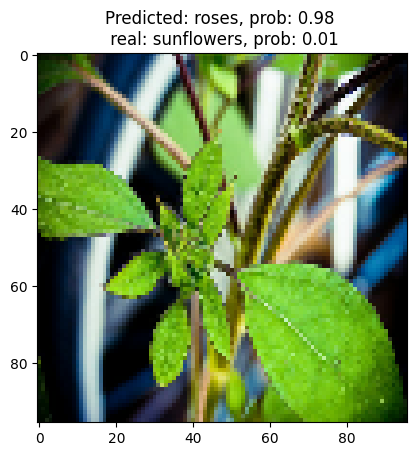

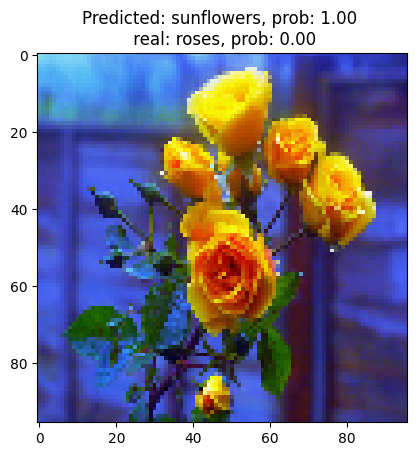

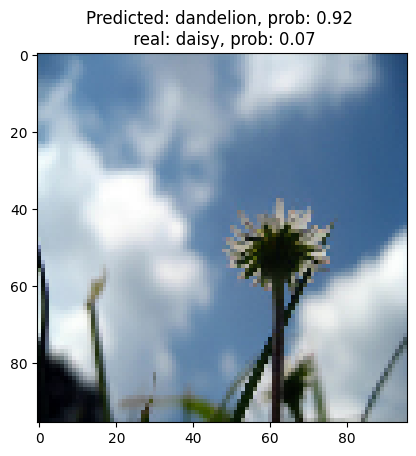

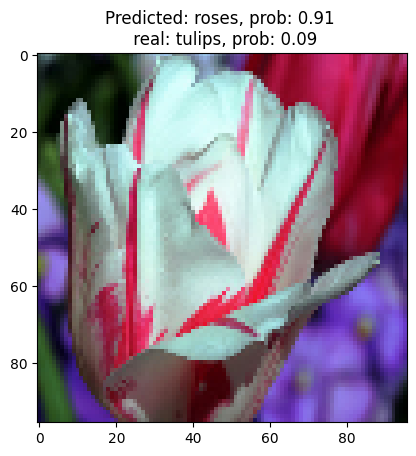

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


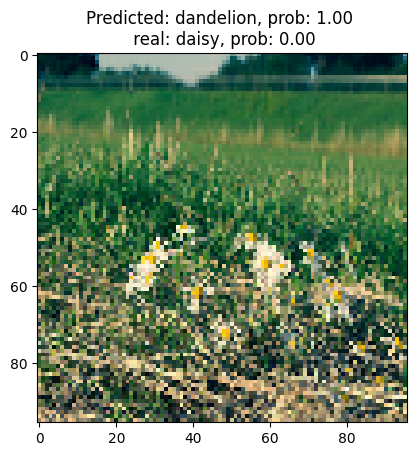

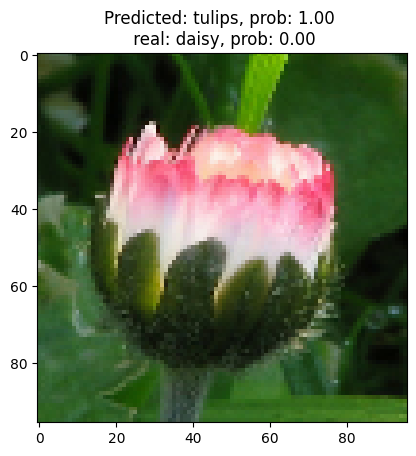

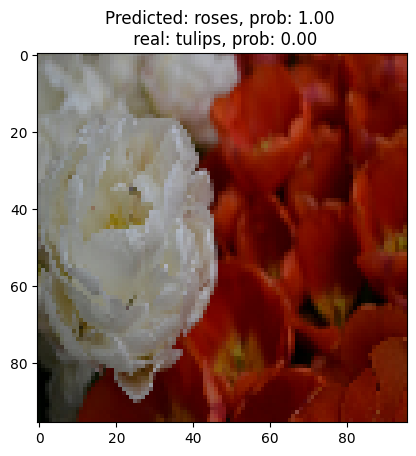

In [ ]:
show_errors(val_ds, model_tl, class_names_list, n_images=10)

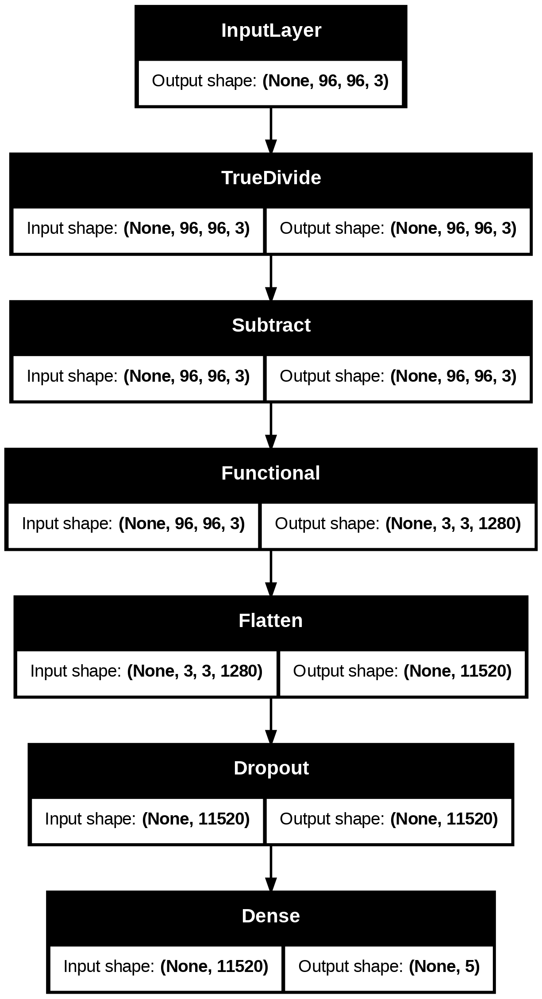

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model_tl, show_shapes=True)

In [ ]:
inputs = tf.keras.Input(shape=image_size+(3, ), name='input')

#data_aug = data_augmentation(inputs)
reescaling = preprocess_input(inputs)

# Conv Layer 1
conv_1 = layers.Conv2D(16, 3, padding='valid',
                       activation='relu', name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(
    2, 2),  name='pool_1')(conv_1)
pool_1 = layers.Dropout(0.4)(pool_1)

# Conv Layer 2
conv_2 = layers.Conv2D(16, 3, padding='valid',
                       activation='relu', name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(name='pool_2')(conv_2)
pool_2 = layers.Dropout(0.4)(pool_2)

# Conv Layer 3
conv_3 = layers.Conv2D(16, 3, padding='valid',
                       activation='relu', name='conv_3')(pool_2)
pool_3 = layers.MaxPooling2D(name='pool_3')(conv_3)
pool_3 = layers.Dropout(0.4)(pool_3)

# Fully-connected
x1 = layers.Flatten(name='flatten')(pool_3)

x2 = pretrained_model(reescaling, training=False)
x2 = tf.keras.layers.Flatten()(x2)

x = tf.keras.layers.Concatenate()([x1, x2])
x = layers.Dropout(0.4)(x)
x = layers.Dense(64, activation='relu', name='dense')(x)
# A Dense classifier with a single unit (binary classification
outputs = tf.keras.layers.Dense(5, activation='softmax')(x)
model_tl = keras.Model(inputs, outputs)

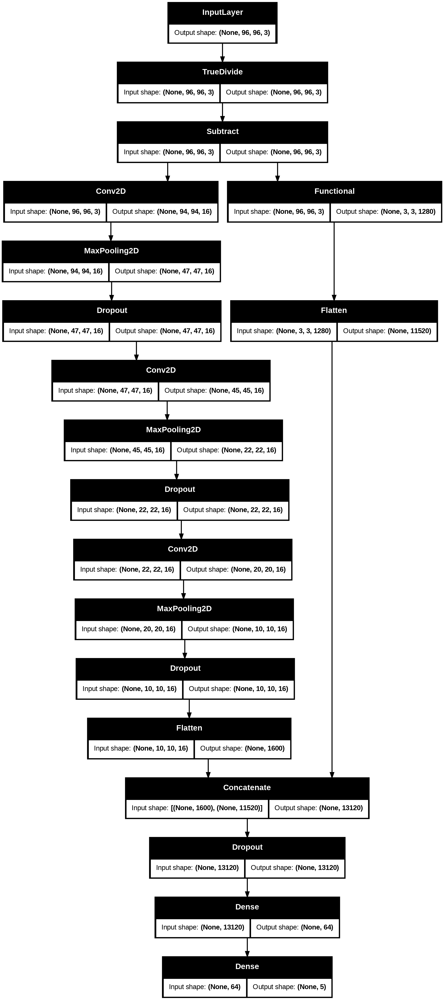

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model_tl, show_shapes=True)

In [ ]:
model_tl.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)
epochs = 15
history = model_tl.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 30s 369ms/step - accuracy: 0.6244 - loss: 1.3468 - val_accuracy: 0.8351 - val_loss: 0.4696
Epoch 2/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.9138 - loss: 0.2445 - val_accuracy: 0.8678 - val_loss: 0.4337
Epoch 3/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9658 - loss: 0.1110 - val_accuracy: 0.8651 - val_loss: 0.4136
Epoch 4/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9841 - loss: 0.0638 - val_accuracy: 0.8651 - val_loss: 0.4593
Epoch 5/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9915 - loss: 0.0394 - val_accuracy: 0.8692 - val_loss: 0.5410
Epoch 6/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9953 - loss: 0.0223 - val_accuracy: 0.8651 - val_loss: 0.5189
Epoch 7/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9959 - loss: 0.0199 - val_accuracy: 0.8747 - val_loss: 0.5315
Epoch 8/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9971 - loss: 0.0147 - val_accuracy: 0.8787 -

2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step


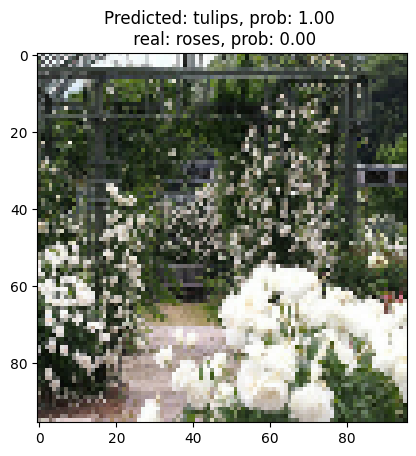

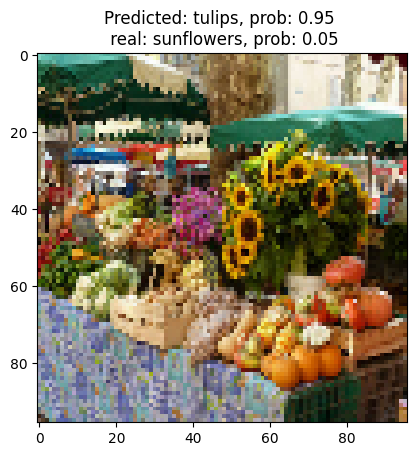

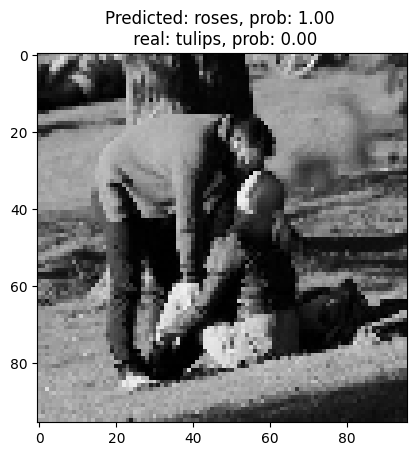

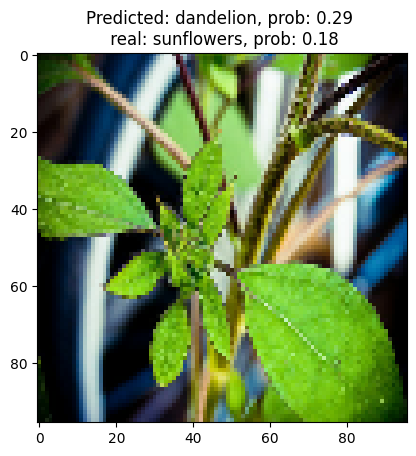

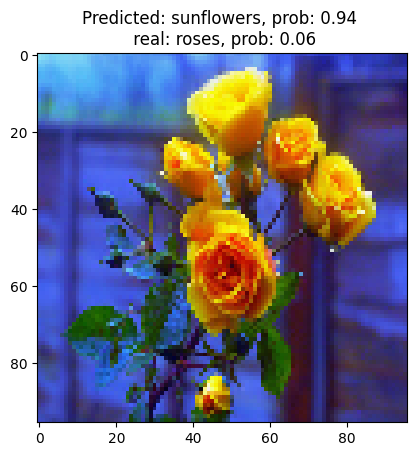

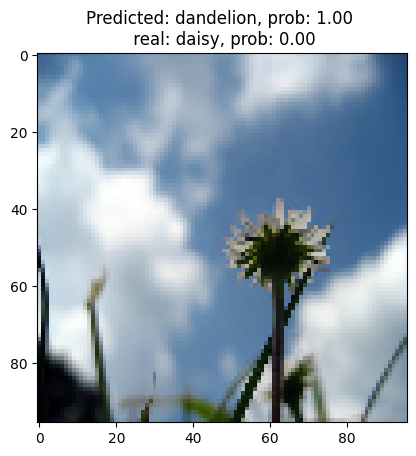

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


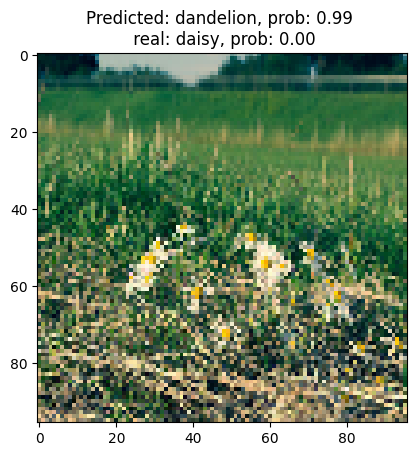

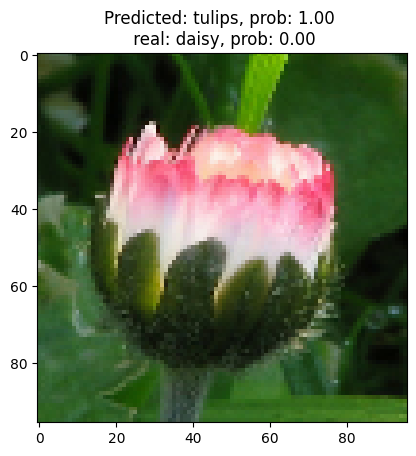

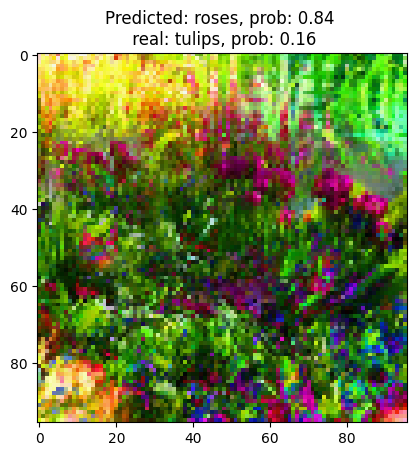

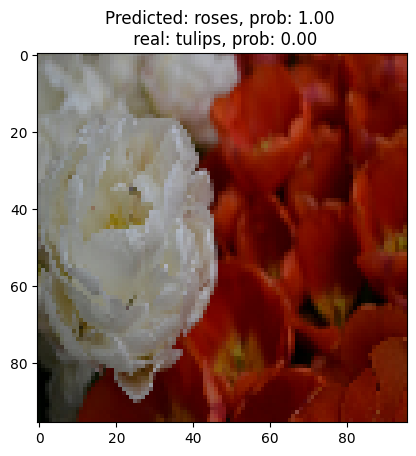

In [ ]:
show_errors(val_ds, model_tl, class_names_list, n_images=10)

Fine-Tunning

In [ ]:
epochs = 20
model_tl = tf.keras.Sequential([
    data_augmentation,
    layers.Rescaling(1./255),
    tf.keras.applications.MobileNetV2(input_shape=image_size+(3, ), include_top=False),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(5, activation='softmax')
])
model_tl.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)
history = model_tl.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 38s 186ms/step - accuracy: 0.5561 - loss: 1.7712 - val_accuracy: 0.6035 - val_loss: 3.0343
Epoch 2/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - accuracy: 0.7361 - loss: 0.8926 - val_accuracy: 0.6158 - val_loss: 4.8637
Epoch 3/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - accuracy: 0.7986 - loss: 0.5791 - val_accuracy: 0.6689 - val_loss: 3.3915
Epoch 4/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - accuracy: 0.8141 - loss: 0.5249 - val_accuracy: 0.7112 - val_loss: 2.7203
Epoch 5/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - accuracy: 0.8290 - loss: 0.4796 - val_accuracy: 0.4823 - val_loss: 8.8956
Epoch 6/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - accuracy: 0.8551 - loss: 0.4041 - val_accuracy: 0.5545 - val_loss: 6.7291
Epoch 7/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8568 - loss: 0.4052 - val_accuracy: 0.6308 - val_loss: 6.0953
Epoch 8/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - accuracy: 0.8665 - loss: 0.3826 - val_accuracy: 